---

<h1>P5 MACHINE LEARNING <span class="tocSkip"></span></h1>
Lérys Granado - 08/2021

---

# Objectives:
- Clustering e-commerce data with unsupervised Machine Learning algorithms
- Taking a similar approach than RFM clustering
- Evaluate relevance & Identify particularities of clusters
- Evaluate temporal stability of the model to propose maintainance plan

# Setting environment

In [1]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

In [2]:
import numpy as np
import scipy.stats as stats
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell
# Allow Jupyter print all instance lines #
InteractiveShell.ast_node_interactivity = "last_expr"  # choose all or last_expr

In [3]:
import seaborn as sns
import matplotlib
from matplotlib import rc
import matplotlib.pyplot as plt
%matplotlib inline
rc = {"font.size": 16, "font.family": "Arial", "axes.labelsize": 16,
      "legend.fontsize": 14, "axes.titlesize": 16,
      "xtick.labelsize": 14, "ytick.labelsize": 14}
sns.set(font="Arial", rc=rc, palette="viridis")
sns.set_style("ticks", {"axes.edgecolor": "k", "axes.linewidth": 0.8, "axes.grid": False,
                        "xtick.major.width": 0.8, "ytick.major.width": 0.8})

# Data import

- Raw data in csv file can be downloaded at "https://www.kaggle.com/olistbr/brazilian-ecommerce"
- Import different dfs

In [1022]:
import os
PATH = os.getcwd()

df_cleaned_PATH = PATH + "\data_cleaned.csv"
df_PATH = PATH + "\df_gped.csv"
X_tsne_PATH = PATH + "\X_tsne.csv"
df_label_PATH = PATH + "\df_label.csv"
df2_PATH = PATH + "\df2.csv"

In [1023]:
df = pd.read_csv(df_PATH).dropna()
df2_eda = pd.read_csv(df2_PATH)
X_tsne = pd.read_csv(X_tsne_PATH)
df_cleaned = pd.read_csv(df_cleaned_PATH)
df_label = pd.read_csv(df_label_PATH)

,customer_unique_id,customer_zip_code_prefix,customer_city_pop,GDP_CAPITA,weekday_purchase,distance,n_order,mean_item_per_order,product_volume,price_mean_item,...,t_delivery_review,payment_type,RURAL_URBAN,customer_state,product_category_name_english,customer_city,date_last_order_year,date_last_order_month,date_last_order_day,date_last_order_weekday
0,0000366f3b9a7992bf8c76cfdf3221e2,7787.0,64114.0,178670.47,3.0,110.690121,1.0,1.0,7.616,129.90,...,0.125000,credit_card,Urbano,SP,bed_bath_table,cajamar,2018,5,10,4
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053.0,666740.0,106841.78,0.0,22.192690,1.0,1.0,5.148,18.90,...,0.208333,credit_card,Urbano,SP,health_beauty,osasco,2018,5,7,1
2,0000f46a3911fa3c0805444483337064,88115.0,209804.0,41960.75,4.0,517.506812,1.0,1.0,43.750,69.00,...,0.375000,credit_card,Urbano,SC,stationery,sao jose,2017,3,10,5
3,0000f6ccb0745a6a4b88665a16c9f078,66812.0,1393399.0,20350.00,3.0,2484.013449,1.0,1.0,1.045,25.99,...,0.083333,credit_card,Urbano,PA,telephony,belem,2017,10,12,4
4,0004aac84e0df4da2b147fca70cf8255,18040.0,586625.0,46888.51,1.0,154.677649,1.0,1.0,0.528,180.00,...,0.000000,credit_card,Urbano,SP,telephony,sorocaba,2017,11,14,2


-  Approximing date to float (unit = year) to ease preprocessing

In [1081]:
df["date_float"] = (df["date_last_order_year"] + \
    (df["date_last_order_month"]/12) + (df["date_last_order_day"]/365))

# Machine Learning clustring on RFM++ data

## Data selection

- We select data and features according to **RFM**:

    - **Recency** – How recently did the customer purchase?
    - **Frequency** – How often do they purchase?
    - **Monetary Value** – How much do they spend?
- However, first tests only on RFM features were not conclusive so we extend this approach by taking other features, we call that **RFM++**
- And we remove very obvious outliers (z-score > 10)

In [597]:
df1 = df[["n_order",
          "date_float",
          "mean_payment_value",
          "payment_installments",
          "review_score",
          "customer_city_pop",
          "customer_unique_id"]]
print(f"Shape df1 with outliers is {df1.shape}")


for col in df1.select_dtypes(include=np.number).columns:
    z_score = (np.abs(df1[col].mean()-df1[col]) / df1[col].std()) < 10
    df1[col] = df1[col][z_score]

df1.dropna(inplace=True)
print(f"Shape df1 without outliers is {df1.shape}")

df2 = df1.sort_values(by="date_float")

Shape df1 with outliers is (91059, 7)
Shape df1 without outliers is (90916, 7)


<ipython-input-597-22fa87d8022f>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1[col] = df1[col][z_score]
C:\Anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


- To evaluate model stability and propose a maintainance plan (ARI score vs. months)
- We split appart data in 10 chunks along date_float variable by taking deciles
- Storing them in the list XX & yy

In [599]:
XX = []

for i in np.linspace(0.1, 1, 10):
    if i == 0.1:
        x = df2[df2["date_float"] <= df2["date_float"].quantile(i)]
    else:
        x = df2[(df2["date_float"] <= df2["date_float"].quantile(i))
                & (df2["date_float"] > df2["date_float"].quantile(i-0.1))]

    XX.append(x)

In [602]:
yy = []

for i in range(len(XX)):
    yy.append(XX[i]["customer_unique_id"].to_list())
    XX[i].drop(columns="customer_unique_id", inplace=True)

C:\Anaconda3\lib\site-packages\pandas\core\frame.py:4901: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


## Preprocessing

In [499]:
from sklearn.preprocessing import StandardScaler, RobustScaler, Normalizer

scaler = StandardScaler()

- Scaling data with classical StandardScaler

In [623]:
XX_scaled = []

for i in range(len(XX)):
    XX_scaled.append(StandardScaler().fit_transform(XX[i]))

- Checking data visualization

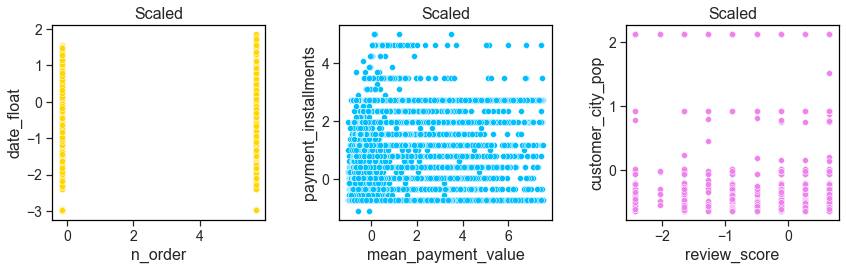

In [645]:
plt.figure(figsize=(12, 4))

plt.subplot(131)
sns.scatterplot(x=X_scaled[:, 0],
                y=X_scaled[:, 1],
                color="gold")
plt.xlabel("n_order")
plt.ylabel("date_float")
plt.title("Scaled")

plt.subplot(132)
sns.scatterplot(x=X_scaled[:, 2],
                y=X_scaled[:, 3],
                color="deepskyblue")
plt.xlabel("mean_payment_value")
plt.ylabel("payment_installments")
plt.title("Scaled")

plt.subplot(133)
sns.scatterplot(x=X_scaled[:, 4],
                y=X_scaled[:, 5],
                color="violet")
plt.xlabel("review_score")
plt.ylabel("customer_city_pop")
plt.title("Scaled")

plt.tight_layout(pad=1)
plt.show()

## Low dimensionality representation

- For purely aesthetic reasons, we apply a dimensionality reduction to represent clusters found in next section
- PCA: not working (variance varies linearly with #component)
- Isomap: too memory intensive
- t-SNE seems adequate but lead different results each time runned
- hence exporting X_tsne components

In [689]:
from sklearn.manifold import TSNE

In [701]:
X_tsne = TSNE(n_components=2, 
              perplexity=30, 
              n_iter=300,
              learning_rate=300, 
              early_exaggeration=12, 
              n_jobs=-1
             ).fit_transform(np.vstack(XX_scaled))

Text(0.5, 1.0, 't-SNE')

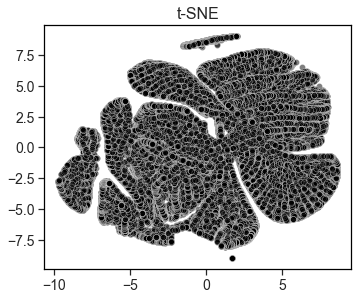

In [702]:
plt.figure(figsize=(5.5,4.5))
sns.scatterplot(x=X_tsne[:,0], 
                y=X_tsne[:,1],
                color="black",
                alpha=0.5
               )
plt.xlabel("")
plt.ylabel("")
plt.title("t-SNE")

In [1011]:
pd.DataFrame(X_tsne).to_csv('X_tsne.csv', index=False)

- Filling colors with labels

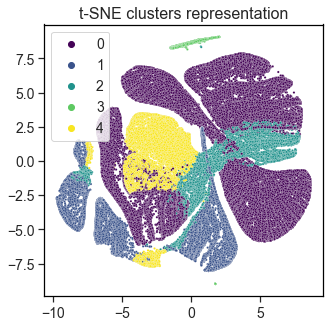

In [1135]:
plt.figure(figsize=(5, 5))

sns.scatterplot(x=X_tsne.iloc[:, 0],
                y=X_tsne.iloc[:, 1],
                hue=true_labels,
                palette=my_c,
                legend="brief",
                s=5
                
                )
plt.xlabel("")
plt.ylabel("")
plt.title("t-SNE clusters representation")
plt.legend()

## Modelling  Kmeans

- Several algorithm were check but were not as conclusive as Kmeans (DBSCAN, Minibatch, Agglomerative clustering)
- Here, we decide to focus on Kmeans

In [728]:
from sklearn.cluster import KMeans

### Elbow  - All scaled data

- Elbow plot will be use to have a first idea of best Ks

In [ ]:
inertia2 = []
K_range = range(1, 40)
for k in K_range:
    model = KMeans(n_clusters=k).fit(np.vstack(XX_scaled[:10]))
    inertia2.append(model.inertia_)

- From Elbow plot, K should be in range 4-10

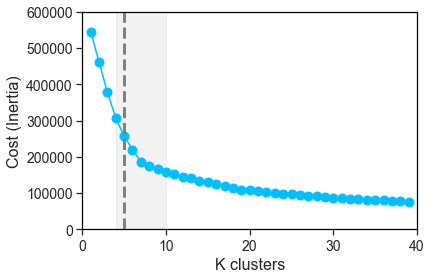

In [1010]:
plt.plot(K_range, inertia2, "o-", ms=9, color="deepskyblue")
plt.xlabel('K clusters')
plt.ylabel('Cost (Inertia)')
plt.xlim(0, 40)
plt.ylabel('Cost (Inertia)')
plt.ylim(0, 600000)
plt.fill_between([4, 10], [600000, 600000], alpha=0.1, color="gray")
plt.axvline(5, ls="--", lw=3, c="gray")

### Fit - All scaled data

- Defining and implementing model
- Fitting all data using a vertical stack of all date deciles
 
         np.vstack(XX_scaled[:10])

- Storing cluster labels as true_labels for ARI evaluation
- I think it is important to seed the model for reproducibility (= 13, here)

In [731]:
model = KMeans(n_clusters=5,
               max_iter=1000,
               n_init=10,
               random_state=13)

model.fit(np.vstack(XX_scaled[:10]))

true_labels = model.predict(np.vstack(XX_scaled[:10]))

### Silouhette plot - All scaled data

C:\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:887: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=1
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.24133601099190866


C:\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:887: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=1
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.27192187698568654


C:\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:887: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=1
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.2900356342771327


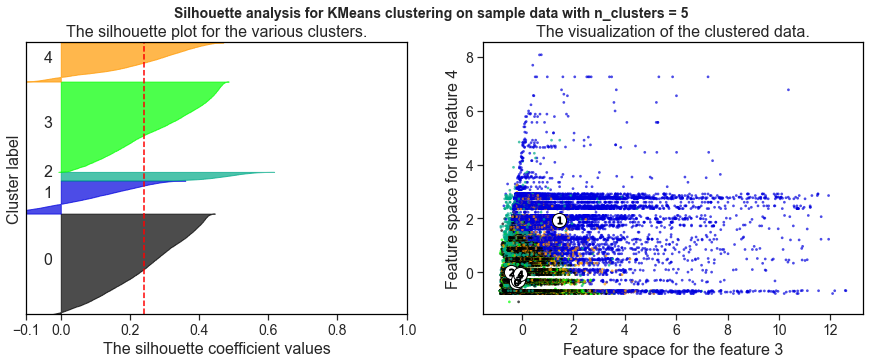

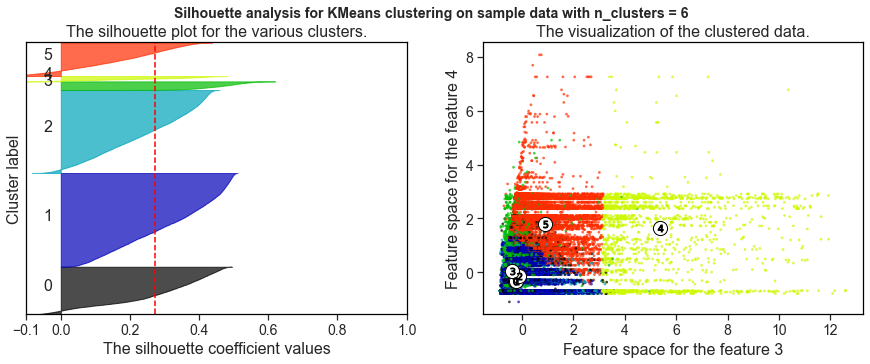

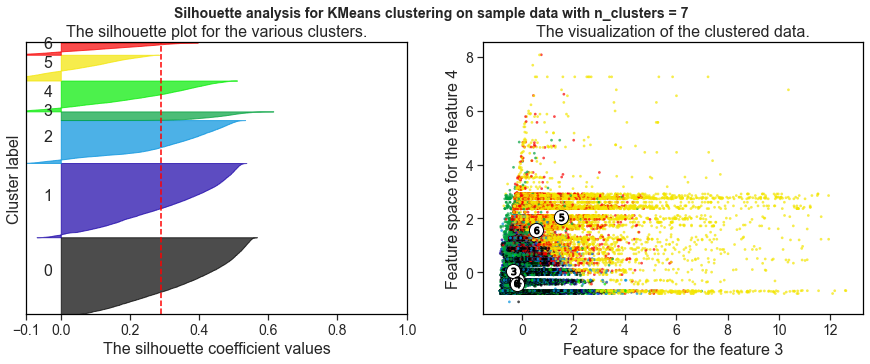

In [733]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score

range_n_clusters = [5, 6, 7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig. set_size_inches(15, 5)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.5, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(np.vstack(XX_scaled[:10])) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = MiniBatchKMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(np.vstack(XX_scaled[:10]))

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(np.vstack(XX_scaled[:10]), cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(
        np.vstack(XX_scaled[:10]), cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(np.vstack(XX_scaled[:10])[:, 2], np.vstack(XX_scaled[:10])[:, 3], 
                marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 2], centers[:, 3], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[2], c[3], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the feature 3")
    ax2.set_ylabel("Feature space for the feature 4")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

### ARI score

- Model fitting with looping along XX
- Each iteration the dataset is **fitted with one more date decile**
- But, important, **all labels (i.e. the whole dataset) are predicted** (this is important to have aligned lists to calculated ARI score)

In [734]:
labels_i = []
for i in range(0, 10):
    model.fit(np.vstack(XX_scaled[:i+1]))
    labels_i.append(model.predict(np.vstack(XX_scaled[:10])))

- Computin ARI score with respect to true_labels (previous **fit and predict** on whole dataset)

In [1073]:
from sklearn import metrics
ARI = []
for i in range(0, 10):
    print(f"ARi score= {metrics.rand_score(true_labels, labels_i[i]):.2f}")
    ARI.append(metrics.rand_score(true_labels, labels_i[i]))

ARi score= 0.98
ARi score= 0.99
ARi score= 0.99
ARi score= 0.99
ARi score= 0.99
ARi score= 0.99
ARi score= 1.00
ARi score= 1.00
ARi score= 1.00
ARi score= 1.00


- Calculating time interval between deciles (in months)

In [1074]:
months = []
for i in np.linspace(0.1, 1, 10):
    x = df2[df2["date_float"] <= df2["date_float"].quantile(i)]
    print(
        f"Months = {((df1['date_float'].max()-x['date_float'].max())*12):.2f}")
    months.append((df1['date_float'].max()-x['date_float'].max())*12)

Months = 16.80
Months = 14.07
Months = 11.80
Months = 10.36
Months = 8.77
Months = 7.33
Months = 5.93
Months = 4.51
Months = 2.90
Months = 0.00


- Plotting ARI score vs months
- We see that the model is very stable
- We can propose 2 maintainance plan:
    - keeping accuracy > 98% => each 1.5 years
    - keeping accuracy > 95% => each 2 years

(-1.0, 25.0)

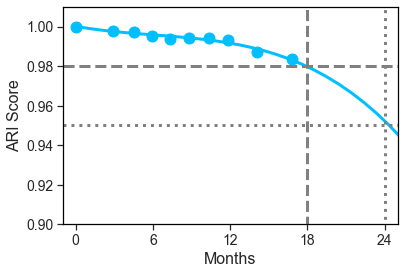

In [1008]:
plt.plot(months, ARI, 'o', ms=11, color="deepskyblue")
model1 = np.poly1d(np.polyfit(months, ARI, 3))
polyline = np.linspace(0, 36, 38)
plt.plot(polyline, model1(polyline), '-', linewidth=3, color='deepskyblue')

plt.plot([-1, 36], [0.98, 0.98], "--", linewidth=3, color='grey')
plt.plot([-1, 36], [0.95, 0.95], ":", linewidth=3, color='grey')
plt.plot([18, 18], [0, 1.01], "--", linewidth=3, color='grey')
plt.plot([24, 24], [0, 1.01], ":", linewidth=3, color='grey')

plt.ylim(0.90, 1.01)
plt.ylabel("ARI Score")
plt.xlabel("Months")
plt.xticks(np.linspace(0, 36, 7))
plt.xlim(-1, 25)

# Interpretation

## Merge label to data

In [740]:
y = np.hstack(yy[:10])
df_mb = pd.DataFrame({"y": y,
                     "true_labels": true_labels.astype(int),
                      })

df_merged = pd.merge(df, df_mb, how="right",
                     left_on="customer_unique_id", right_on="y")
df_label = df_merged.drop(columns="y")
print(df_label.shape)
df_label.head()

y              0
true_labels    0
dtype: int64

In [1012]:
df_label.to_csv("df_label.csv", index=False)

## Univariate analysis of cluster distribution

In [1160]:
np.linspace(0, 100, n_colors, dtype=int)

array([  0,  25,  50,  75, 100])

In [24]:
n=5
myC= [(sns.color_palette("viridis", 101)[i])for i in np.linspace(0, 100, n, dtype=int)]
sns.palplot(myC)





In [26]:
sns.palplot(myC)
plt.show()

NameError: name 'plt' is not defined

In [975]:
cluster_names = ["#0: average customers",
                 "#1: townspeople",
                 "#2: high-valued",
                 "#3: frequent ",
                 "#4: unsatisfied ", ]

Text(0.5, 0, 'Distribution (%)')

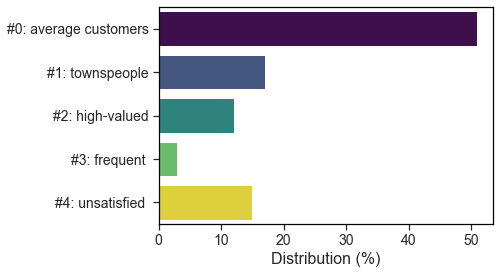

In [1130]:
plt.figure()
sns.barplot(x=[51, 17, 12, 3, 15],
            y=cluster_names,
            orient='h',
            palette=my_c
            )
plt.yticks(np.linspace(0, 4, 5), cluster_names)
plt.ylabel("")
plt.xlabel("Distribution (%)")

## Bivariate analysis claster with some numerical features

In [745]:
columns = ["customer_city_pop", "n_order", "mean_payment_value",
           "payment_installments", "review_score"]

In [1172]:
for i in range(0,5):
        print(f"{col :-<20} {i :-<20} {df_label[df_label.true_labels == i][col].mean()}")

review_score-------- 0------------------- 4.686322564146279
review_score-------- 1------------------- 4.548703726785492
review_score-------- 2------------------- 4.283975659229209
review_score-------- 3------------------- 4.133829639889196
review_score-------- 4------------------- 1.6782928784896858


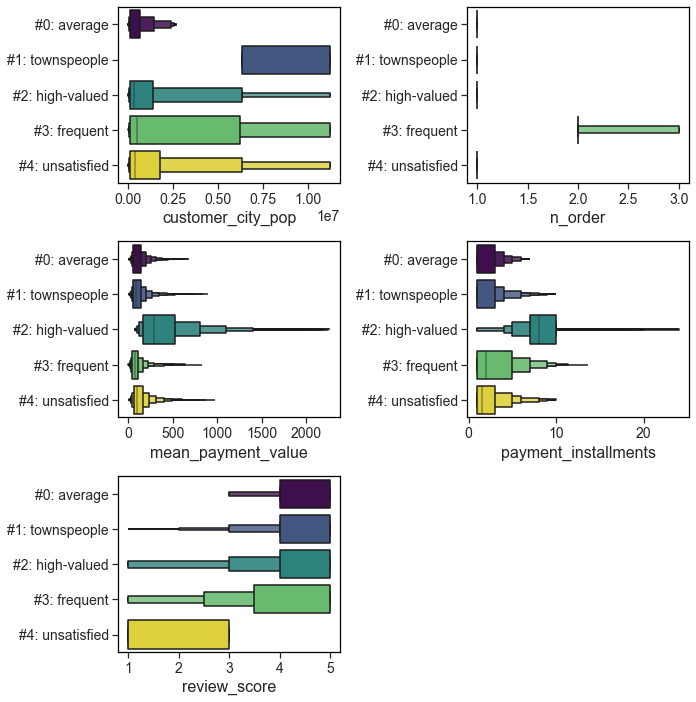

customer_city_pop--- 0------------------- 536420.9599139034
customer_city_pop--- 1------------------- 10014858.686588557
customer_city_pop--- 2------------------- 1556545.0425081577
customer_city_pop--- 3------------------- 2863868.6405817172
customer_city_pop--- 4------------------- 1918299.2117501276
n_order------------- 0------------------- 1.0
n_order------------- 1------------------- 1.0
n_order------------- 2------------------- 1.000264573595555
n_order------------- 3------------------- 2.068905817174515
n_order------------- 4------------------- 1.0
mean_payment_value-- 0------------------- 111.59371387775926
mean_payment_value-- 1------------------- 112.13041630312668
mean_payment_value-- 2------------------- 413.5679116324203
mean_payment_value-- 3------------------- 94.7057617728534
mean_payment_value-- 4------------------- 132.52047306654828
payment_installments 0------------------- 2.0036228795499107
payment_installments 1------------------- 2.1338962981428393
payment_instal

In [1174]:
plt.figure(figsize=(10, 10))
i = 1

for col in columns:
    plt.subplot(3, 2, i)
    sns.boxenplot(data=df_label,
                  orient="h",
                  showfliers=False,
                  label=col,
                  y="true_labels",
                  x=col,
                  palette=my_c)

    plt.xlabel(col)
    plt.ylabel("")
    plt.yticks(ticks=[0, 1, 2, 3, 4],
               labels=["#0: average",
                       "#1: townspeople",
                       "#2: high-valued",
                       "#3: frequent",
                       "#4: unsatisfied"])
    i += 1

plt.tight_layout(pad=1)
plt.show()

for col in columns:
    for i in range(0,5):
        print(f"{col :-<20} {i :-<20} {df_label[df_label.true_labels == i][col].mean()}")

From last plot we can identify the particularity of the clusters: <br>
#0: average customers <br>
#1: townspeople<br>
#2: high-valued <br>
#3: frequent customers <br>
#4: unsatisfied customers <br>

## Bivariate analysis cluster/product category

In [1114]:
df_label[df_label["true_labels"] == i]["product_category_name_english"].value_counts()

health_beauty                4175
sports_leisure               3968
bed_bath_table               3883
computers_accessories        3473
furniture_decor              2915
                             ... 
cds_dvds_musicals               6
la_cuisine                      6
computers                       5
fashion_childrens_clothes       2
security_and_services           1
Name: product_category_name_english, Length: 71, dtype: int64

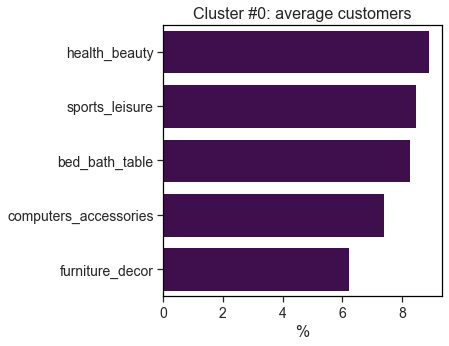

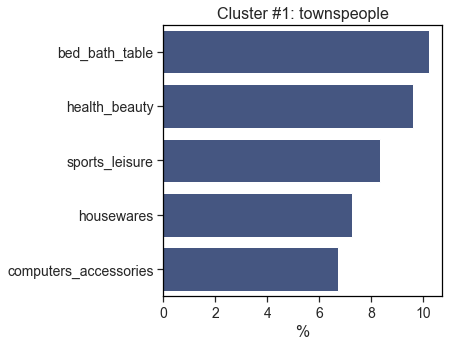

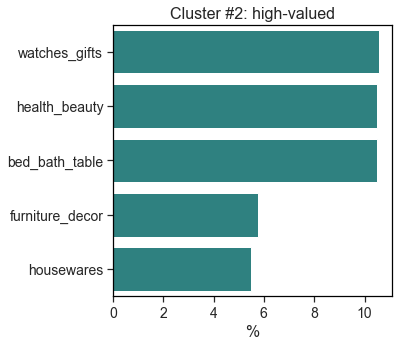

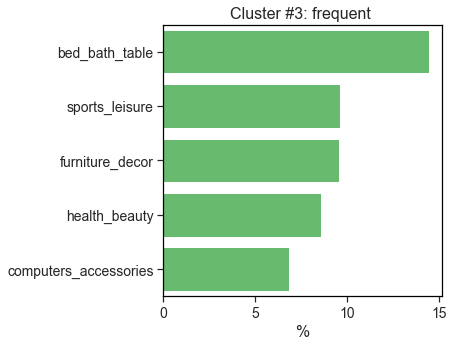

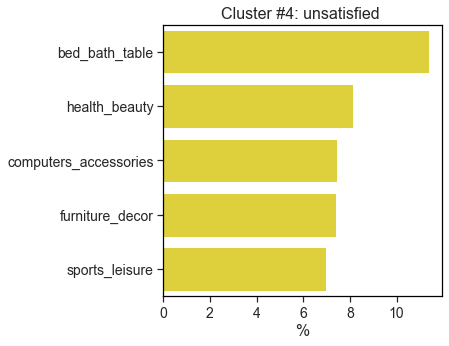

In [1149]:
for i in range(0, 5):
    x = 100*df_label[df_label["true_labels"] == i]["product_category_name_english"].value_counts(normalize=True)
    plt.figure(figsize=(5, 5))
    sns.barplot(x=x.head(5),
                y=x.head(5).index,
                color=my_c[i],
                orient="h")
    plt.xlabel("%")
    plt.ylabel("")
    plt.title(f"Cluster {cluster_names[i]}")
    plt.show()

In [ ]:
# my_colors = sns.color_palette("viridis", n_colors=10)

# plt.figure(figsize=(7.5, 2.5))
# (df_label["product_category_name_english"].value_counts(
#     normalize=True).sort_values(ascending=False).head(10)*100) \
#     .plot(kind="bar", color=my_colors)
# plt.ylim(0, 16)
# plt.ylabel("Category distribution (%)")
# plt.title("All clusters")

# plt.figure(figsize=(15, 15))
# for i in range(0, 5):
#     plt.subplot(3, 2, i+1)
#     (df_label[df_label["true_labels"] == i]
#      ["product_category_name_english"].value_counts(
#         normalize=True).sort_values(ascending=False).head(10)*100) \
#         .plot(kind="bar", color=my_colors)
#     plt.ylim(0, 16)
#     plt.ylabel("Category distribution (%)")
#     plt.title(f"Cluster {cluster_names[i]}")
# plt.tight_layout(pad=1)
# plt.show()

## Brazil map

In [1053]:
df_geoloc = df2_eda[["customer_unique_id", "geolocation_lat_customer",
                     "geolocation_lng_customer"]].groupby("customer_unique_id").mean()
df_geoloc = pd.merge(df_geoloc,
                     df_label[["customer_unique_id", "true_labels"]],
                     on="customer_unique_id",
                     how="inner",
                     )

In [1164]:
import plotly.express as px

fig = px.scatter_mapbox(df_geoloc,
                        lat="geolocation_lat_customer",
                        lon="geolocation_lng_customer",
                        color=df_geoloc["true_labels"],
                        zoom=1.5,
                        height=500,
                        color_continuous_scale="viridis",
                        
                    
                        )

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

# Additional plots & data for PowerPoint

In [1077]:
df["n_order"].describe()

count    91059.000000
mean         1.036097
std          0.218576
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         17.000000
Name: n_order, dtype: float64

Text(0.5, 0, '')

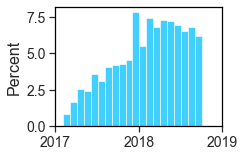

In [1105]:
plt.figure(figsize=(3,2.2))
sns.histplot(df["date_float"], stat="percent", 
             binwidth=(1/12), color="deepskyblue" )
plt.xlim(2017,2019)
plt.xticks([2017, 2018, 2019])
plt.xlabel("")


<AxesSubplot:>

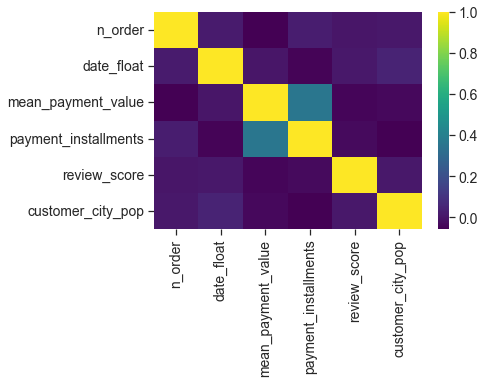

In [1108]:
sns.heatmap(df1.select_dtypes(np.number).corr(), cmap="viridis")